# Анализ и прогнозирование временных рядов методами искусственного интеллекта

## **Практическая работа 4. Матричный профиль. Поиск примитивов на его основе.**

Смените рабочую директорию с помощью команды `chdir()`. Для этого передайте этой команде свой путь до каталога, в котором содержатся материалы четвертой практической работы. После выполнения этой команды все последующие операции с файлами и каталогами будут производиться относительно указанного каталога.

In [1]:
import os

practice_dir_path = r"C:\Users\admin\Desktop\TimeSeries\2025-Telyakov_TimeSeriesCourse\practice\04 Matrix profile"
os.chdir(practice_dir_path)

Выполните команды, которые автоматически перезагружают все импортированные модули при их изменении.

In [2]:
%load_ext autoreload
%autoreload 2

Импортируйте библиотеки и модули, необходимые для реализации практической работы 4.

In [3]:
!pip install stumpy

In [7]:
import pandas as pd
import numpy as np
import os
import datetime

from modules.plots import *
from modules.mp import compute_mp
from modules.motifs import top_k_motifs
from modules.discords import top_k_discords
from modules.meter_swapping_detection import *

## **Часть 1.** Матричный профиль. Поиск мотивов и диссонансов.

### **Задача 1.**
Загрузите временной ряд, который содержит данные о почасовом потреблении электроэнергии некоторого итальянского города, снимаемые в течение 3 лет, начиная с 1 января 1995 года.

In [8]:
ts_url = './datasets/part1/italianpowerdemand.csv'

ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

Визуализируйте временной ряд, используя функцию `plot_ts()` из модуля *plot.py*.

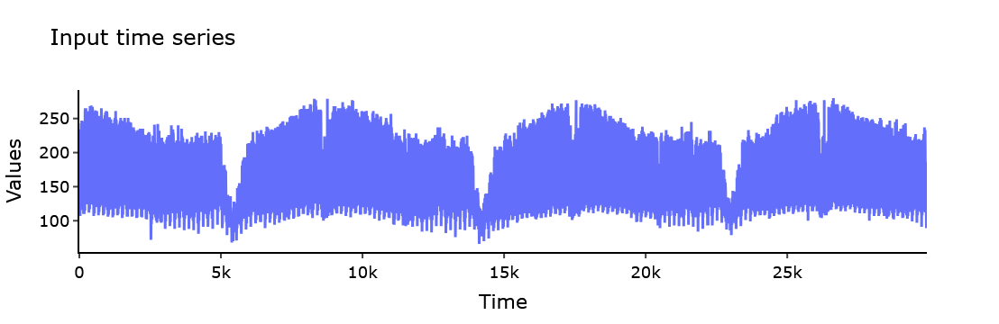

In [10]:
plot_ts(ts, "Input time series")

Анализ временных рядов на основе матричного профиля осуществляет библиотека [stumpy](https://stumpy.readthedocs.io/en/latest/index.html). Напишите функцию `compute_mp()` в модуле *mp.py*, которая вычисляет матричный профиль временного ряда на основе выбранной вами функции из библиотеки *stumpy*.

In [11]:
m = 165
excl_zone = int(np.ceil(m / 2))
mp = {}

# Вычисление матричного профиля
mp = compute_mp(ts, m, excl_zone)

# Проверка результатов
print(f"Длина матричного профиля: {len(mp['mp'])}")
print(f"Длина подпоследовательности: {mp['m']}")
print(f"Зона исключения: {mp['excl_zone']}")
print(f"Мин. расстояние: {np.min(mp['mp']):.4f}")
print(f"Макс. расстояние: {np.max(mp['mp']):.4f}")

Длина матричного профиля: 29767
Длина подпоследовательности: 165
Зона исключения: 83
Мин. расстояние: 1.2266
Макс. расстояние: 8.8861


Визуализируйте найденный матричный профиль ряда.

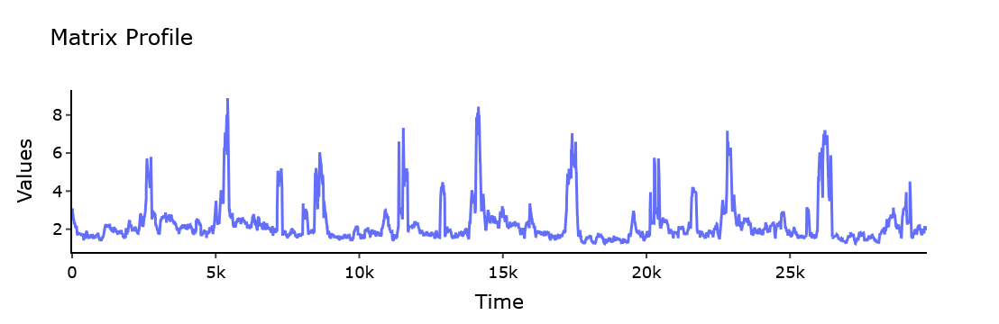

In [12]:
plot_ts(mp['mp'], "Matrix Profile")

### **Задача 2.**
Выполните поиск top-$k$ мотивов в исходном временном ряде на основе построенного матричного профиля. Для этого реализуйте самостоятельно функцию `top_k_motifs()` в модуле *motifs.py*. Среди найденных мотивов не должно быть тривиальных совпадений, поэтому в `top_k_motifs()` добавьте вызов функции `apply_exclusion_zone()` из модуля *utils.py*.

In [13]:
top_k = 6
motifs = {}

# Поиск top-k мотивов
motifs = top_k_motifs(mp, top_k)

# Вывод результатов
print("=" * 60)
print(f"{'Top-' + str(top_k) + ' мотивы':^60}")
print("=" * 60)
print(f"{'№':<5}{'Индекс 1':<12}{'Индекс 2':<12}{'Расстояние':<15}")
print("-" * 60)

for i, (idx_pair, dist) in enumerate(zip(motifs['indices'], motifs['distances'])):
    print(f"{i+1:<5}{idx_pair[0]:<12}{idx_pair[1]:<12}{dist:<15.4f}")

print("=" * 60)

                        Top-6 мотивы                        
№    Индекс 1    Индекс 2    Расстояние     
------------------------------------------------------------
1    17852       18188       1.2266         
2    18539       27276       1.2356         
3    19168       28073       1.2456         
4    26945       18208       1.2458         
5    19343       28080       1.2716         
6    18779       18611       1.3081         


Выполните визуализацию найденных top-$k$ 

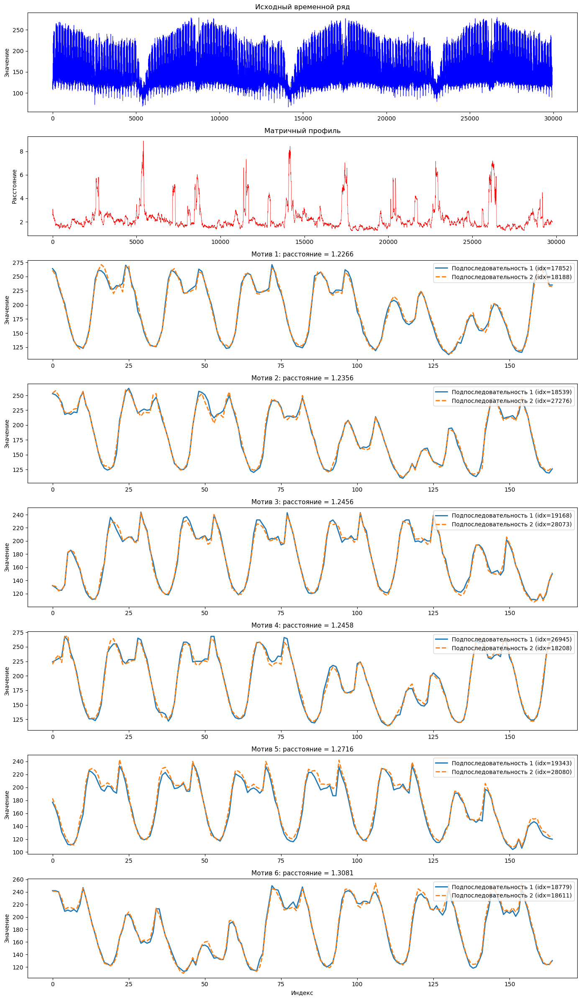

In [15]:
import matplotlib.pyplot as plt

# Визуализация найденных мотивов
fig, axes = plt.subplots(top_k + 2, 1, figsize=(14, 3 * (top_k + 2)))

# Исходный временной ряд
axes[0].plot(ts, color='blue', linewidth=0.5)
axes[0].set_title('Исходный временной ряд', fontsize=12)
axes[0].set_ylabel('Значение')

# Матричный профиль
axes[1].plot(mp['mp'], color='red', linewidth=0.5)
axes[1].set_title('Матричный профиль', fontsize=12)
axes[1].set_ylabel('Расстояние')

# Визуализация каждого мотива
m = mp['m']
for i, (idx_pair, dist) in enumerate(zip(motifs['indices'], motifs['distances'])):
    idx1, idx2 = idx_pair
    
    # Подпоследовательности мотива
    subseq1 = ts[idx1:idx1 + m]
    subseq2 = ts[idx2:idx2 + m]
    
    axes[i + 2].plot(subseq1, label=f'Подпоследовательность 1 (idx={idx1})', linewidth=2)
    axes[i + 2].plot(subseq2, label=f'Подпоследовательность 2 (idx={idx2})', linewidth=2, linestyle='--')
    axes[i + 2].set_title(f'Мотив {i+1}: расстояние = {dist:.4f}', fontsize=11)
    axes[i + 2].legend(loc='upper right')
    axes[i + 2].set_ylabel('Значение')

axes[-1].set_xlabel('Индекс')
plt.tight_layout()
plt.show()

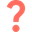
Проанализируйте и изложите содержательный смысл полученных результатов.

Мотивы представляют собой наиболее часто повторяющиеся паттерны во временном ряде потребления электроэнергии. Для данного набора данных (почасовое потребление электроэнергии итальянского города за 3 года) найденные мотивы имеют следующий содержательный смысл:
- Суточные циклы	Мотивы отражают типичные суточные паттерны потребления: низкое потребление ночью, пики утром и вечером
- Недельная периодичность	Похожие паттерны повторяются в одни и те же дни недели (например, рабочие дни vs выходные)
- Сезонность	Подобные паттерны могут встречаться в одинаковые сезоны разных лет
- Малые расстояния	Чем меньше расстояние между подпоследовательностями мотива, тем более устойчивым и повторяющимся является данный паттерн
- Практическое применение	Найденные мотивы можно использовать для прогнозирования потребления, выявления аномалий и планирования энергоснабжения

### **Задача 3.**
Реализуйте самостоятельно функцию `top_k_discords()` в модуле *discords.py*, предназначенную для поиска top-$k$ диссонансов во временном ряде на основе матричного профиля. Чтобы исключить попадание тривиальных совпадений в результирующее множество диссонансов воспользуйтесь функцией `apply_exclusion_zone()` из модуля *utils.py*.

Загрузите временной ряд *nyc_taxi.csv* из директории *./datasets/part1/*, содежащий данные о среднем числе пассажиров NY такси за осень 2014 года.

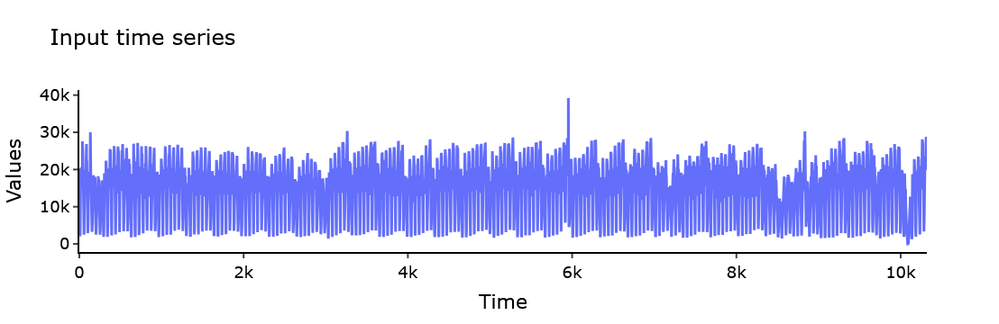

In [16]:
ts_url = './datasets/part1/nyc_taxi.csv'

ts = pd.read_csv(ts_url, index_col=0, header=0).squeeze().to_numpy()
plot_ts(ts, "Input time series")

In [18]:
m = 96
excl_zone = int(np.ceil(m / 2))
mp = {}

ts = ts.astype(np.float64)
# Вычисление матричного профиля
mp = compute_mp(ts, m, excl_zone)

print(f"Длина временного ряда: {len(ts)}")
print(f"Длина подпоследовательности (m): {m}")
print(f"Зона исключения: {excl_zone}")
print(f"Длина матричного профиля: {len(mp['mp'])}")

Длина временного ряда: 10320
Длина подпоследовательности (m): 96
Зона исключения: 48
Длина матричного профиля: 10225


In [19]:
top_k = 15
discords = {}

# Поиск top-k диссонансов
discords = top_k_discords(mp, top_k)

# Вывод результатов
print("=" * 70)
print(f"{'Top-' + str(top_k) + ' диссонансы':^70}")
print("=" * 70)
print(f"{'№':<5}{'Индекс':<12}{'Расстояние':<18}{'Индекс ближ. соседа':<20}")
print("-" * 70)

for i in range(len(discords['indices'])):
    idx = discords['indices'][i]
    dist = discords['distances'][i]
    nn_idx = discords['nn_indices'][i]
    print(f"{i+1:<5}{idx:<12}{dist:<18.4f}{nn_idx:<20}")

print("=" * 70)

                          Top-15 диссонансы                           
№    Индекс      Расстояние        Индекс ближ. соседа 
----------------------------------------------------------------------
1    9985        7.6761            9650                
2    10048       7.5286            8469                
3    8784        6.0736            9263                
4    10097       5.1110            257                 
5    8837        4.4923            5618                
6    5868        4.2410            6204                
7    105         4.1657            7112                
8    9651        3.9471            8307                
9    8410        3.7368            8361                
10   5954        3.7068            5282                
11   7107        3.6989            8452                
12   8459        3.5142            7115                
13   154         3.4415            7210                
14   8640        3.2855            7295                
15   2915        3

Выполните визуализацию найденных top-$k$ диссонансов.

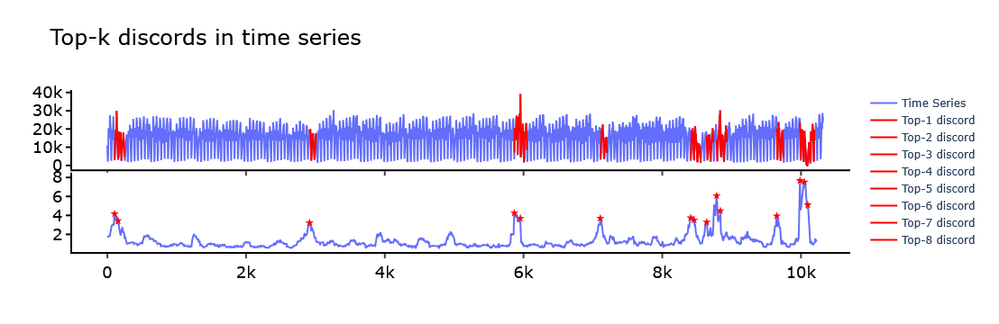

In [20]:
plot_discords(mp, discords)

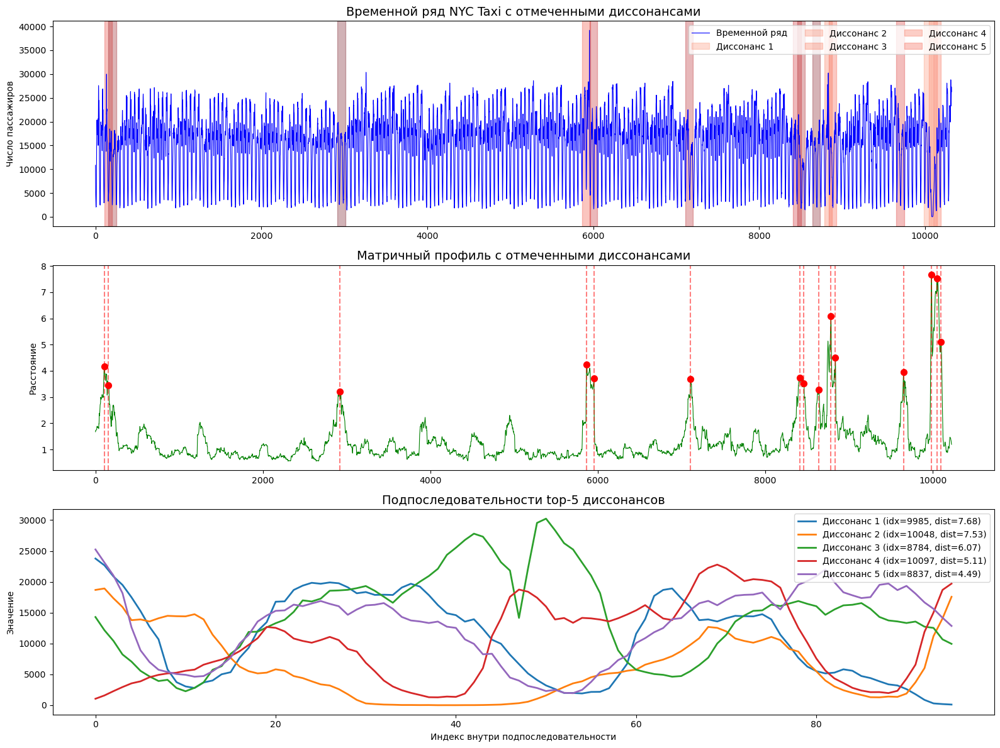

In [21]:
import matplotlib.pyplot as plt

# Визуализация временного ряда с отмеченными диссонансами
fig, axes = plt.subplots(3, 1, figsize=(16, 12))

# 1. Исходный временной ряд с отмеченными диссонансами
axes[0].plot(ts, color='blue', linewidth=0.8, label='Временной ряд')
colors = plt.cm.Reds(np.linspace(0.4, 1, top_k))

for i, idx in enumerate(discords['indices']):
    axes[0].axvspan(idx, idx + m, alpha=0.3, color=colors[i], 
                     label=f'Диссонанс {i+1}' if i < 5 else None)

axes[0].set_title('Временной ряд NYC Taxi с отмеченными диссонансами', fontsize=14)
axes[0].set_ylabel('Число пассажиров')
axes[0].legend(loc='upper right', ncol=3)

# 2. Матричный профиль с отмеченными диссонансами
axes[1].plot(mp['mp'], color='green', linewidth=0.8)
for i, idx in enumerate(discords['indices']):
    axes[1].axvline(x=idx, color='red', alpha=0.5, linestyle='--')
    axes[1].scatter(idx, discords['distances'][i], color='red', s=50, zorder=5)

axes[1].set_title('Матричный профиль с отмеченными диссонансами', fontsize=14)
axes[1].set_ylabel('Расстояние')

# 3. Подпоследовательности диссонансов (первые 5)
num_to_show = min(5, len(discords['indices']))
for i in range(num_to_show):
    idx = discords['indices'][i]
    subseq = ts[idx:idx + m]
    axes[2].plot(subseq, label=f'Диссонанс {i+1} (idx={idx}, dist={discords["distances"][i]:.2f})', 
                 linewidth=2)

axes[2].set_title('Подпоследовательности top-5 диссонансов', fontsize=14)
axes[2].set_xlabel('Индекс внутри подпоследовательности')
axes[2].set_ylabel('Значение')
axes[2].legend(loc='upper right')

plt.tight_layout()
plt.show()

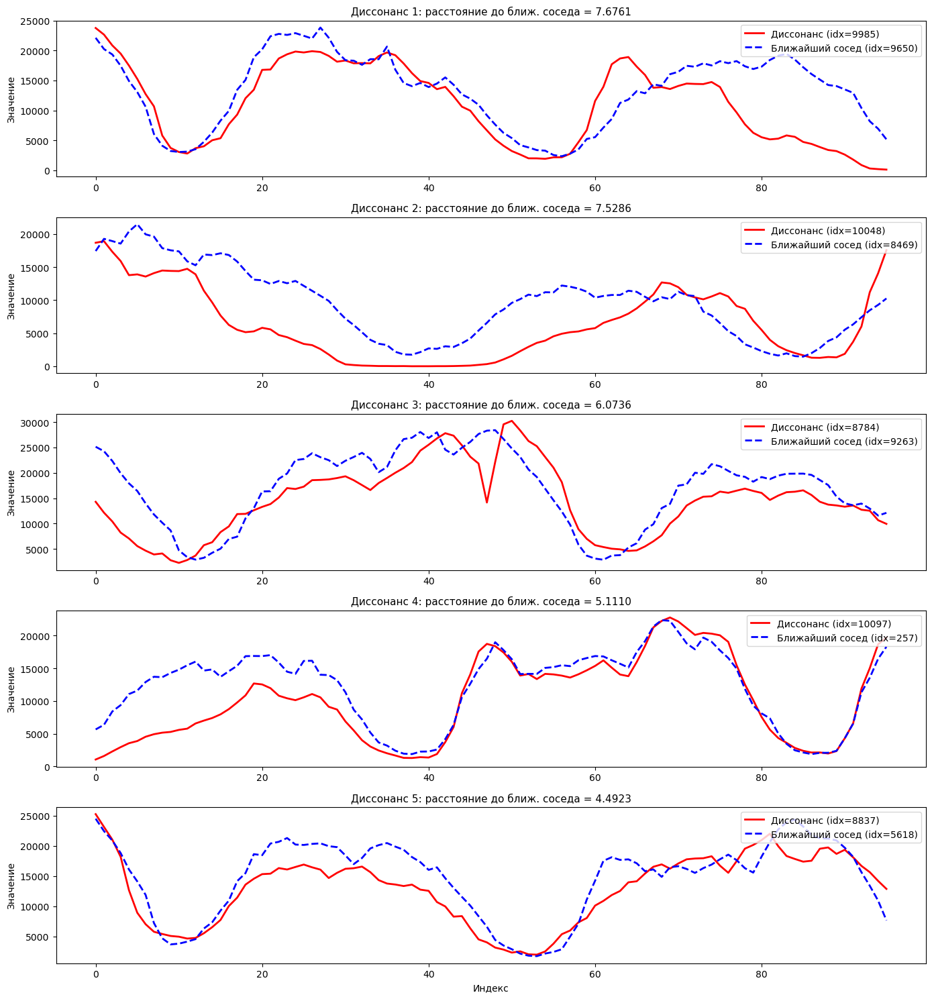

In [22]:
# Визуализация каждого диссонанса и его ближайшего соседа
fig, axes = plt.subplots(5, 1, figsize=(14, 15))

for i in range(min(5, len(discords['indices']))):
    idx = discords['indices'][i]
    nn_idx = discords['nn_indices'][i]
    dist = discords['distances'][i]
    
    subseq = ts[idx:idx + m]
    nn_subseq = ts[nn_idx:nn_idx + m]
    
    axes[i].plot(subseq, label=f'Диссонанс (idx={idx})', linewidth=2, color='red')
    axes[i].plot(nn_subseq, label=f'Ближайший сосед (idx={nn_idx})', 
                 linewidth=2, linestyle='--', color='blue')
    axes[i].set_title(f'Диссонанс {i+1}: расстояние до ближ. соседа = {dist:.4f}', fontsize=11)
    axes[i].legend(loc='upper right')
    axes[i].set_ylabel('Значение')

axes[-1].set_xlabel('Индекс')
plt.tight_layout()
plt.show()

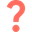
Проанализируйте и изложите содержательный смысл полученных результатов.

Диссонансы представляют собой аномальные, нетипичные паттерны во временном ряде числа пассажиров такси в Нью-Йорке. Для данного набора данных (осень 2014 года) найденные диссонансы имеют следующий содержательный смысл:
- Праздничные дни	Диссонансы часто соответствуют праздникам (День благодарения, Рождество), когда паттерн использования такси резко отличается от обычного
- Аномальные события	Могут отражать массовые мероприятия, погодные катаклизмы или транспортные происшествия
- Нетипичные дни	Выходные после праздников или дни с нехарактерно низким/высоким спросом
- Большие расстояния	Чем больше расстояние в матричном профиле, тем более уникальной является подпоследовательность
- Отсутствие похожих паттернов	Диссонансы — это подпоследовательности, для которых не существует близких "двойников" в данных

## **Часть 2.** Сегментация повторяющихся активностей.

### **Задача 4.**

Загрузите временной ряд PAMAP *pamap.csv* из директории *./datasets/part2/*, представляющий собой показания закрепленного на человеке виброакселерометра. Данный ряд включает показания, снятые при выполнении человеком трех видов физической активности: ходьба, подъем по лестнице и спуск по лестнице. Необходимо сегментировать временной ряд на основе его матричного профиля для определения того, когда человек шел и когда поднимался/спускался. Поскольку подъем и спуск по лестнице – это схожие действия, поэтому будем считать, что это одна активность.  

In [23]:
ts_url = './datasets/part2/pamap.csv'

ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

Визуализируйте временной ряд PAMAP.

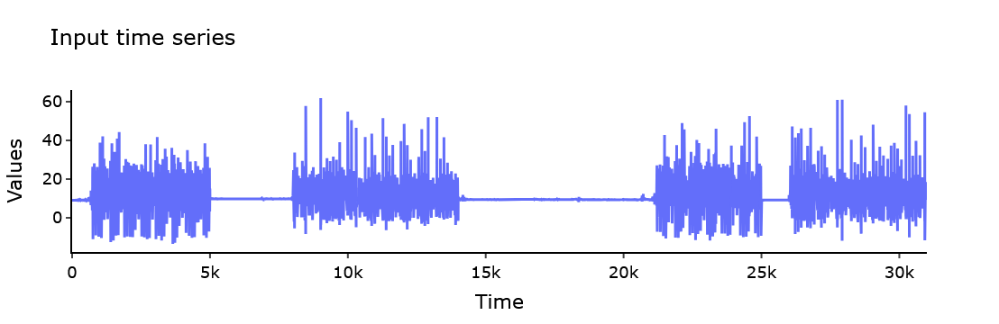

In [24]:
plot_ts(ts, "Input time series")

Найдите и визуализируйте матричный профиль временного ряда.

In [25]:
m = 100
excl_zone = m
mp = {}

# Вычисляем матричный профиль
mp = compute_mp(ts, m, exclusion_zone=excl_zone)

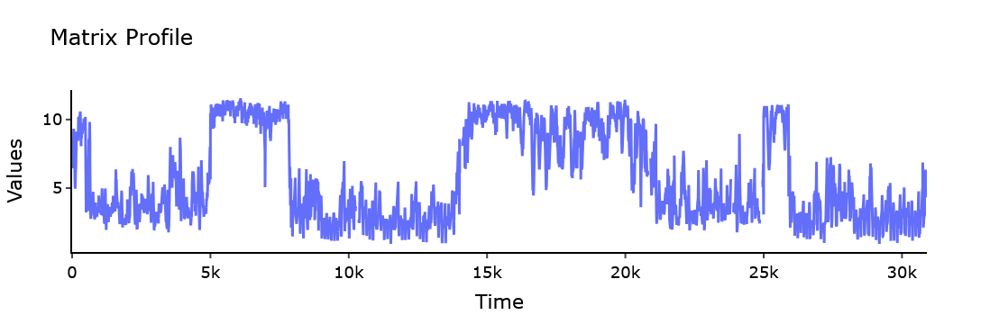

In [26]:
plot_ts(mp['mp'], "Matrix Profile")

Вычислите порог по формуле, которая представлена в презентации [04 Matrix profile.pdf](https://github.com/mzym/TimeSeriesCourse/blob/main/slides/04%20Matrix%20profile.pdf).

In [32]:
threshold = 0
# Вычисляем порог как среднее значение матричного профиля
P = mp['mp'].astype(float)

# 2. Фильтруем значения, убирая бесконечности (решает проблему с threshold = inf)
P_finite = P[np.isfinite(P)]

# Проверка, чтобы не упало на пустом массиве
if len(P_finite) == 0:
    print("Ошибка: массив пуст после фильтрации бесконечностей.")
    threshold = 0
else:
    # 3. Вычисляем порог по формуле
    alpha = 0.5
    threshold = alpha * (np.min(P_finite) + np.max(P_finite))

print(f"Calculated threshold: {threshold}")

Calculated threshold: 6.246194213752261


Выполните визуализацию результатов сегментации повторяющихся активностей.

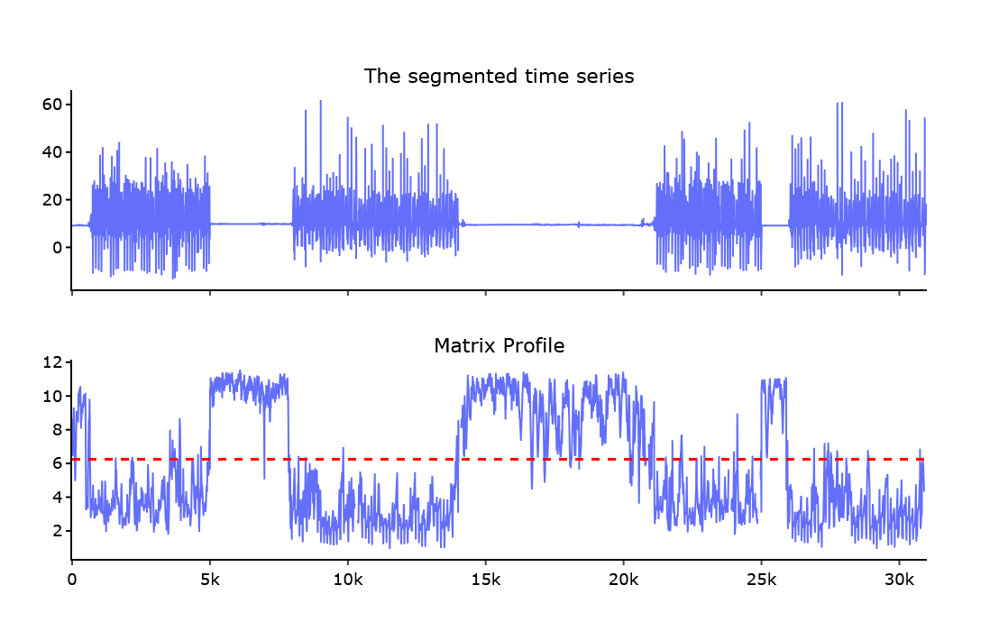

In [33]:
plot_segmentation(mp, threshold)

Загрузите истинную разметку временного ряда PAMAP *pamap_labels.csv*, где 0 означает ходьбу, 1 – подъем по лестнице, 2 – спуск с лестницы. Вычислите точность по метрике accuracy, сравнив полученные результаты по основе матричного профиля с истинной разметкой.

In [36]:
labels_url = './datasets/part2/pamap_labels.csv'

labels = pd.read_csv(labels_url, header=None).squeeze().to_numpy()

In [37]:
from sklearn.metrics import accuracy_score

# 1. Подготовка истинных меток
# Объединяем классы 1 (подъем) и 2 (спуск) в один класс 1 (лестница)
# Класс 0 (ходьба) оставляем без изменений
binary_labels = labels.copy()
binary_labels[binary_labels == 2] = 1

# 2. Выравнивание размеров
# Матричный профиль имеет длину len(ts) - m + 1. 
# Метка i соответствует подпоследовательности, начинающейся в i.
# Обрезаем метки до длины профиля.
valid_labels = binary_labels[:len(mp['mp'])]

# 3. Формирование предсказаний
# Обычно более "стабильная" или частая активность (ходьба) имеет меньшие расстояния в профиле (мотивы),
# а более сложная или редкая (лестница) - большие.
# Предполагаем: MP < threshold -> класс 0 (ходьба), иначе -> класс 1 (лестница)
predictions = np.where(mp['mp'] < threshold, 0, 1)

# 4. Вычисление точности
acc = accuracy_score(valid_labels, predictions)

# Если предположение о полярности классов было неверным (точность < 0.5), инвертируем предсказание
if acc < 0.5:
    predictions = 1 - predictions
    acc = accuracy_score(valid_labels, predictions)

print(f"Accuracy: {acc:.4f}")

Accuracy: 0.9359


## **Чaсть 3.** Casy Study: Раскрытие краж электричества подменой счетчиков (meter-swapping detection).


### **Задача 5.**

Рассмотрим практическое применение использования матричного профиля для решения задачи, связанной с раскрытием краж электричества путем подмены счетчиков.

Загрузите временные ряды из директории *./datasets/part3/*, которые были выбраны случайным образом из набора данных (House 1, 2, 3, 4 и 11), содержащего данные потребления электроэнергии 20 жилых домов в Великобритании с 1 января по 23 декабря 2014 года.

In [40]:
path = './datasets/part3/'

house_idx = [1, 2, 3, 4, 11]

filenames = [f"House{i}.csv" for i in house_idx]

consumptions = {}
for house in filenames:
    consumptions[house[:-4]] = pd.read_csv(os.path.join(path, house), header=None, index_col=0)
    consumptions[house[:-4]].index = pd.to_datetime(consumptions[house[:-4]].index)

Далее смоделируем событие замены счетчика. Для этого каждый временной ряд разделим на две части: "Head" (до 1 октября) и "Tail" (после 1 октября). После чего выберем случайным образом 2 временных ряда (например, House1 и House11) и поменяем местами их "Tail" части.

In [42]:
cutoff = pd.to_datetime('2014-10-01')
heads, tails = heads_tails(consumptions, cutoff, house_idx)

# swap Heads and Tails of 1 and 11
swap1, swap2 = 1, 11

# Используем pd.concat вместо .append
consumptions[f'House{swap1}'] = pd.concat([heads[f'H_{swap1}'], tails[f'T_{swap2}']])
consumptions[f'House{swap2}'] = pd.concat([heads[f'H_{swap2}'], tails[f'T_{swap1}']])

heads, tails = heads_tails(consumptions, cutoff, house_idx)

Визуализируйте исходные временные ряды и параллельную оси OY прямую, которая делит временные ряды на "Head" и "Tail" части.

In [43]:
plot_consumptions_ts(consumptions, cutoff, house_idx)

Чтобы найти переставленную пару временных рядов, выполним следующее. Сначала составим временные ряды $H_i$ из всевозможных комбинаций "Head" и "Tail" частей исходных временных рядов $T_K$, где $1 \leq i \leq |T|^2$, $1 \leq K \leq |T|$. В нашем случае, $|T| = 5$.  Далее среди них найдем такую пару временных рядов $(H_i, H_j)$, которая имеет минимальную оценку $swap\_score$. Минимальная оценка $swap\_score$ для пары рядов $(H_i, H_j)$ вычисляется следующим образом:

\begin{equation}
swap\_score(i,j) = \frac{\min{(Head_{H_i} \bowtie Tail_{H_j})}}{\min{(Head_{H_i} \bowtie Tail_{H_i})}+eps},
\end{equation}

где $\bowtie$ – операция нахождения матричного профиля между двумя временными рядами. Матричный профиль между двумя временными рядами содержит расстояния между всеми подпоследовательностями первого временного ряда и их ближайшими соседями, которые являются подпоследовательностями второго временного ряда.

Добавьте в функцию `compute_mp()` в модуле *mp.py* поддежку вычисления матричного профиля между двумя различными временными рядами и найдите пару временных рядов $(H_i, H_j)$, которая имеет минимальную оценку $swap\_score$ среди всех пар.

In [49]:
m = 24 * 4

min_score = meter_swapping_detection(heads, tails, house_idx, m)

Starting detection among 5 houses...


In [51]:
min_i, min_j, mp_j = min_score['i'], min_score['j'], min_score['mp_j']
print(f'Time series with minimum score is (H_{min_i}, T_{min_j}).')

Time series with minimum score is (H_11, T_1).


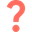
Проанализируйте и изложите содержательный смысл полученных результатов.

Результат (H_11, T_1) означает, что алгоритм успешно "узнал", что хвост, присоединенный к первому счетчику (T_1), на самом деле принадлежит семье, живущей в доме 11 (H_11).

Это демонстрирует эффективность матричного профиля для задачи Meter Swapping Detection: метод позволяет автоматически выявлять ошибки учета или кражи электроэнергии (когда потребитель платит по чужому счетчику), просто анализируя историческую согласованность данных без необходимости физической проверки.